### Part A

#### Q1:

An Intrusion Detection System (IDS) is a system that monitors and analyzes data to detect any intrusion in a system or network. IDSs are essential for maintaining the security and integrity of data by identifying potential threats and attacks. The KDD99 dataset, is widely used for training and testing IDS models. It is possible to implement an IDS on this dataset using Big Data techniques.


Implementation of an Intrusion Detection System (IDS):
- Loading dataset: Load the dataset and export it into Resilient Distributed Datasets (RDD) DataFrame in Apache Spark.
- Data preprocessing: Convert categorical data to numerical data and use standardization techniques ont the dataset to improve classification efficiency.
- Feature selection: Use ChiSqSelector feature selection method mentioned in the paper to select most relevant feature. This step helps in reducing the dimensionality of the data and improving the performance of the model.
- Build IDS: Build IDS using the Support Vector Machine (SVM) classifier.
- Training and testing: The dataset is split into training and testing sets, and the SVM classifier is trained on the training set. The performance of the model is then evaluated on the testing set to determine its accuracy and efficiency.
- Performance evaluation: The results are compared between the Chi-SVM classifier and the Logistic Regression classifier. The mectrics succh as Area Under ROC (AUROC) and  Area Under Precision-Recall curve (AUPR), and computational time for evaluation are usd for comparison.


In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.types import *
from pyspark.sql.functions import * 

from pyspark.sql.functions import col, when
from pyspark.ml.feature import VectorAssembler, StandardScaler, StringIndexer, ChiSqSelector
from pyspark.sql import Row
from pyspark.ml.classification import LinearSVC, LogisticRegression
from pyspark.ml import Pipeline
from pyspark.ml.feature import OneHotEncoder
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

import urllib.request
import os
import matplotlib.pyplot as plt
import seaborn as sns

spark = SparkSession.builder.appName("Kurama").getOrCreate()

#### Q2:

In [0]:

urllib.request.urlretrieve("http://kdd.ics.uci.edu/databases/kddcup99/kddcup.data_10_percent.gz", "/tmp/kddcup_data.gz")
dbutils.fs.mv("file:/tmp/kddcup_data.gz", "dbfs:/kdd/kddcup_data.gz")
display(dbutils.fs.ls("dbfs:/kdd"))

path,name,size,modificationTime
dbfs:/kdd/kddcup_data.gz,kddcup_data.gz,2144903,1720068689000


#### Q3:

In [0]:
# Load the data from the Databricks filesystem into an RDD
rdd = sc.textFile("dbfs:/kdd/kddcup_data.gz")

# Print 10 values from the RDD
print("First 10 values in RDD:")
for value in rdd.take(10):
    print(value)

# Verify the type of the data structure
print("Data structure type:", type(rdd))

First 10 values in RDD:
0,tcp,http,SF,181,5450,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,9,9,1.00,0.00,0.11,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,239,486,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,19,19,1.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,235,1337,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,29,29,1.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,219,1337,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,39,39,1.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,217,2032,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,49,49,1.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,217,2032,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,59,59,1.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,212,1940,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,0.00,0.00,0.00,0.00,1.00,0.00,1.

#### Q4:

In [0]:
rdd_split = rdd.map(lambda line: line.split(","))

# Get the number of features (columns)
num_features = len(rdd_split.first())
print(f"Total number of features (columns): {num_features}")

Total number of features (columns): 42


In [0]:
# Define the schema based on the number of features
columns = [f"feature_{i}" for i in range(num_features)]

# Convert the RDD to a DataFrame
df = rdd_split.map(lambda row: Row(*row)).toDF(columns)

# Show the first few rows of the DataFrame
display(df)

feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41
0,tcp,http,SF,181,5450,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,9,9,1.00,0.00,0.11,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,239,486,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,19,19,1.00,0.00,0.05,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,235,1337,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,29,29,1.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,219,1337,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,39,39,1.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,217,2032,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,49,49,1.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,217,2032,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,6,6,0.00,0.00,0.00,0.00,1.00,0.00,0.00,59,59,1.00,0.00,0.02,0.00,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,212,1940,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,2,0.00,0.00,0.00,0.00,1.00,0.00,1.00,1,69,1.00,0.00,1.00,0.04,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,159,4087,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.00,0.00,0.00,0.00,1.00,0.00,0.00,11,79,1.00,0.00,0.09,0.04,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,210,151,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,8,89,1.00,0.00,0.12,0.04,0.00,0.00,0.00,0.00,normal.
0,tcp,http,SF,212,786,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,8,8,0.00,0.00,0.00,0.00,1.00,0.00,0.00,8,99,1.00,0.00,0.12,0.05,0.00,0.00,0.00,0.00,normal.


#### Q5: 
There should be 7 columns as (duration, protocol_type, service, src_bytes, dst_bytes, flag and label) are 7, so I have created a df with 7 columns instead of 6 as mentioned in the Q5.

In [0]:
# Extract the specified columns (assuming their positions are known)
rdd_extracted = rdd_split.map(lambda row: (row[0], row[1], row[2], row[4], row[5], row[6], row[-1]))

# Define the schema for the new DataFrame
columns = ["duration", "protocol_type", "service", "src_bytes", "dst_bytes", "flag", "label"]

# Convert the RDD to a DataFrame
df_extracted = rdd_extracted.map(lambda row: Row(*row)).toDF(columns)

# Print the schema of the new DataFrame
print("Datazframe schema:")
df_extracted.printSchema()

# Display the first 10 rows of the new DataFrame
print("Display first 10 rows of Dataframe:")
df_extracted.show(10, truncate=False)

Datazframe schema:
root
 |-- duration: string (nullable = true)
 |-- protocol_type: string (nullable = true)
 |-- service: string (nullable = true)
 |-- src_bytes: string (nullable = true)
 |-- dst_bytes: string (nullable = true)
 |-- flag: string (nullable = true)
 |-- label: string (nullable = true)

Display first 10 rows of Dataframe:
+--------+-------------+-------+---------+---------+----+-------+
|duration|protocol_type|service|src_bytes|dst_bytes|flag|label  |
+--------+-------------+-------+---------+---------+----+-------+
|0       |tcp          |http   |181      |5450     |0   |normal.|
|0       |tcp          |http   |239      |486      |0   |normal.|
|0       |tcp          |http   |235      |1337     |0   |normal.|
|0       |tcp          |http   |219      |1337     |0   |normal.|
|0       |tcp          |http   |217      |2032     |0   |normal.|
|0       |tcp          |http   |217      |2032     |0   |normal.|
|0       |tcp          |http   |212      |1940     |0   |normal.|


#### Q6:

+-------------+------+
|protocol_type| count|
+-------------+------+
|          udp| 20354|
|          tcp|190065|
|         icmp|283602|
+-------------+------+

+-----------+-----+
|    service|count|
+-----------+-----+
|     tftp_u|    1|
|    pm_dump|    1|
|      red_i|    1|
|      tim_i|    7|
|        X11|   11|
|      urh_i|   14|
|        IRC|   43|
|     Z39_50|   92|
|    netstat|   95|
|        ctf|   97|
|       name|   98|
|     kshell|   98|
|       exec|   99|
|netbios_dgm|   99|
|   http_443|   99|
|       ldap|  101|
|      pop_2|  101|
|       link|  102|
| netbios_ns|  102|
|    daytime|  103|
+-----------+-----+
only showing top 20 rows



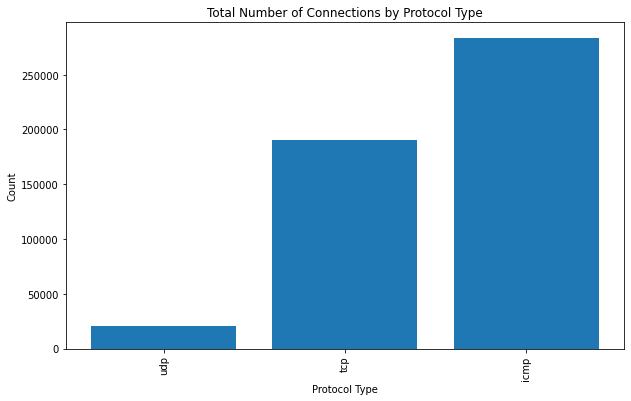

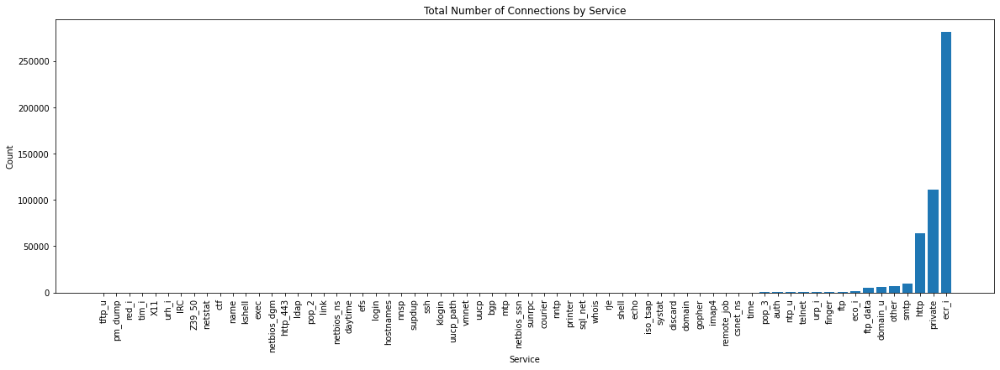

In [0]:
# Group by protocol_type and count
protocol_count = df_extracted.groupBy("protocol_type").count().orderBy("count", ascending=True)
protocol_count.show()

# Group by service and count
service_count = df_extracted.groupBy("service").count().orderBy("count", ascending=True)
service_count.show()

# Convert to Pandas DataFrame for plotting
protocol_count_pd = protocol_count.toPandas()
service_count_pd = service_count.toPandas()

# Plot for protocol_type
plt.figure(figsize=(10, 6))
plt.bar(protocol_count_pd['protocol_type'], protocol_count_pd['count'])
plt.title('Total Number of Connections by Protocol Type')
plt.xlabel('Protocol Type')
plt.ylabel('Count')
plt.xticks(rotation=90)

# Plot for service
plt.figure(figsize=(20, 6))
plt.bar(service_count_pd['service'], service_count_pd['count'])
plt.title('Total Number of Connections by Service')
plt.xlabel('Service')
plt.ylabel('Count')
plt.xticks(rotation=90)

plt.show()

#### Q7:

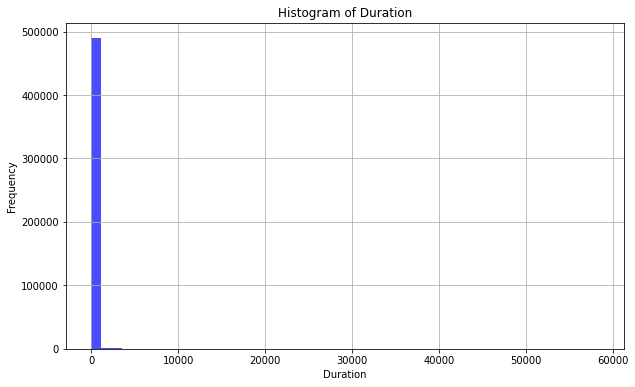

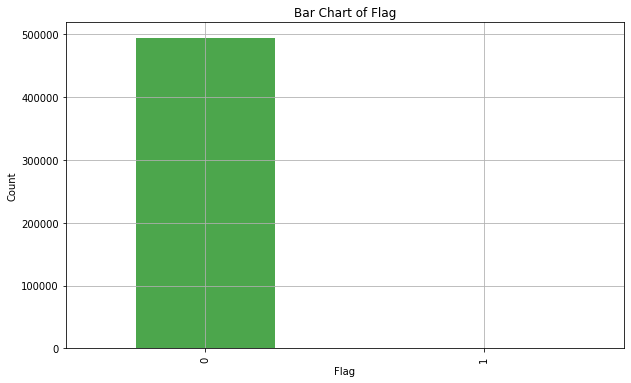

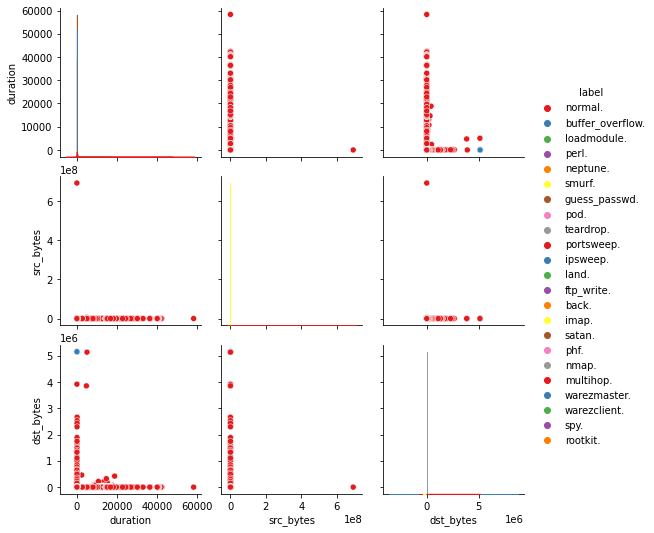

In [0]:
# Convert the Spark DataFrame to a Pandas DataFrame for easier plotting
df_pd = df_extracted.toPandas()

# Convert columns to appropriate data types
df_pd['duration'] = df_pd['duration'].astype(int)
df_pd['src_bytes'] = df_pd['src_bytes'].astype(int)
df_pd['dst_bytes'] = df_pd['dst_bytes'].astype(int)


# Plot 1: Histogram of `duration`
plt.figure(figsize=(10, 6))
plt.hist(df_pd['duration'], bins=50, color='blue', alpha=0.7)
plt.title('Histogram of Duration')
plt.xlabel('Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Plot 2: Bar chart of `flag`
plt.figure(figsize=(10, 6))
df_pd['flag'].value_counts().sort_index().plot(kind='bar', color='green', alpha=0.7)
plt.title('Bar Chart of Flag')
plt.xlabel('Flag')
plt.ylabel('Count')
plt.grid(True)
plt.show()

# Plot 3: Pair plot for selected numerical features
sns.pairplot(df_pd[['duration', 'src_bytes', 'dst_bytes', 'label']], hue='label', palette='Set1')
plt.show()

Explanation of Plots
Histogram of duration:

Plot 1: The histogram shows the distribution of connection durations in the dataset. It helps identify the most common duration ranges and any potential outliers. This visualization is useful to understand the general behavior of connection times.

Plot 2: The bar chart displays the count of different flag values. Flags indicate the status of a network connection (e.g., SF for successful connections). This chart helps understand the distribution of connection statuses in the dataset.

Plot 3: The pair plot visualizes relationships between multiple numerical features (duration, src_bytes, dst_bytes) and their distribution with respect to the label (e.g., normal or attack). Pair plots are useful to explore potential correlations and interactions between features, and to observe how the target variable is distributed across these features.

#### Q8:

In [0]:
# Create the new label column
df_extracted = df_extracted.withColumn("new_label", when(df_extracted["label"] == "normal.", "normal").otherwise("attack"))

# Show the new label column
df_extracted.select("label", "new_label").show(10)

+-------+---------+
|  label|new_label|
+-------+---------+
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
|normal.|   normal|
+-------+---------+
only showing top 10 rows



In [0]:
from sklearn.model_selection import train_test_split

# Convert the Spark DataFrame to a Pandas DataFrame for easier handling with sklearn
df_pd = df_extracted.toPandas()

# Select a few columns for the model
features = ['duration', 'protocol_type', 'src_bytes', 'dst_bytes']
X = df_pd[features]
y = df_pd['new_label']

# Encode categorical features
X = pd.get_dummies(X, columns=['protocol_type'])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [0]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Initialize and train the Logistic Regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label='normal')
recall = recall_score(y_test, y_pred, pos_label='normal')
f1 = f1_score(y_test, y_pred, pos_label='normal')
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Classification Report:\n{report}")

Accuracy: 0.8356965740600172
Precision: 0.8842079329884208
Recall: 0.1854492843486798
F1 Score: 0.3065949085938835
Classification Report:
              precision    recall  f1-score   support

      attack       0.83      0.99      0.91     79452
      normal       0.88      0.19      0.31     19353

    accuracy                           0.84     98805
   macro avg       0.86      0.59      0.61     98805
weighted avg       0.84      0.84      0.79     98805



Rationale behind choosing Logistic Regression:

The task is to classify network connections as either 'normal' or 'attack'. Logistic Regression is well-suited for binary classification tasks where the output is binary (in this case, 'normal' or 'attack'). In addition, Logistic Regression provides interpretable results. It outputs probabilities and coefficients for each feature, which can help in understanding which features are more influential in predicting the class labels.

### Part B

#### Q1:
1. No. This statement is incorrect. While PaaS solutions in Azure do provide a platform for hosting web apps, they do not inherently provide professional development services to continuously add features to custom applications. PaaS offerings typically provide the infrastructure and platform for developers to build, run, and manage applications without the complexity of maintaining the underlying infrastructure. However, the actual development and feature addition are still the responsibility of the developers or the organization using the PaaS solution.

2. Yes. This statement is correct. PaaS database offerings in Azure do provide built-in high availability. PaaS solutions are designed to offer high availability as part of their core features. This means that the platform automatically handles aspects like redundancy, failover, and data replication to ensure that the database remains accessible and operational, even in the event of hardware failures or other issues. 

#### Q2:
d. Strong consistency guarantees are required.

 Explanation: Relational databases are known for their ACID (Atomicity, Consistency, Isolation, Durability) properties. They provide strong consistency guarantees, ensuring that all clients see the same data at the same time. This is crucial for applications such as financial transactions or inventory management systems.

#### Q3:
d. Configuring the SaaS solution

 Explanation: When implementing a Software as a Service (SaaS) solution, the primary responsibility of the user or organization is to configure the software according to their specific needs. The SaaS provider handles all of the technical aspects, while the customer focuses on tailoring the software to their requirements such as setting up user accounts, customizing features, defining workflows, and adjusting settings to align with business processes.

#### Q4:

1. No. This statement is incorrect. A hybrid cloud model doesn't necessarily require migration from a private cloud. A hybrid cloud is a combination of public and private cloud environments. A company can achieve a hybrid cloud model by: (a) Starting with on-premises infrastructure and adding public cloud services; (b) Starting with a public cloud and adding private cloud components; (c) Building both private and public cloud components simultaneously. The key is the integration of both private and public cloud resources, not the starting point or migration path.

2. Yes. This statement is correct. One of the main benefits of using a public cloud is the ability to extend or augment an organization's internal IT capabilities. Companies can use public cloud services to: (a) Add additional computing power; (b) Increase storage capacity;
(c) Scale resources up or down based on demand; (d) Access specialized services or technologies not available in-house.

3. No. This statement is incorrect. In a public cloud model, resources are not restricted to only guest users of a company. Access to resources in a public cloud is controlled by the cloud service provider and the company using the service through various authentication and authorization mechanisms. The company can define who has access to which resources, and this can include both internal employees and external users, depending on the company's needs and security policies.

#### Q5:
a. Fault Tolerant.

Explanation: Fault tolerance refers to the ability of a system to continue operating properly in the event of the failure of one or more of its components. In cloud computing, this means that services remain available and functional even when certain parts of the system fail.


b. Disaster Recovery.

Explanation: Disaster recovery involves a set of policies, tools, and procedures to enable the recovery or continuation of vital technology infrastructure and systems following a natural or human-induced disaster. It focuses on restoring services after a major disruption, rather than preventing the disruption itself.


c. Dynamic Scalability.

Explanation: Dynamic scalability is the ability of a cloud service to automatically increase or decrease its capacity and resources to maintain stable performance during varying workloads. This ensures that the service can handle increased demand without significant performance degradation.


d. Low Latency.

Explanation: Low latency refers to a short delay between an action and its result. In cloud computing, it means that services respond quickly to requests, providing fast access and minimal delay when users interact with the service over the internet.
